In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from IPython import display
plt.style.use('seaborn')

file_name = "data/210413_BNP_transect/BNP_data_collection_210413.h5"
h5_file = h5py.File(file_name, "r")

In [2]:
ses1 = 'session001/cal001'
inserts = list(h5_file[f'{ses1}'].keys())
vis_waves = h5_file[ses1].attrs['spec1_wavelengths_vector'][:]
ftir_waves = h5_file[ses1].attrs['spec2_wavelengths_vector'][:]

In [3]:
depth_min = -0.2
depth_max = 90.0

def normalize_depth(depth):
    return (depth - depth_min) / (depth_max - depth_min)

# Transect 1: top of hill to bottom, visible light spectrometer

4/13/2021

Insertions begin at top of the hill and extend to the bottom of the hill towards the swamp edge. 

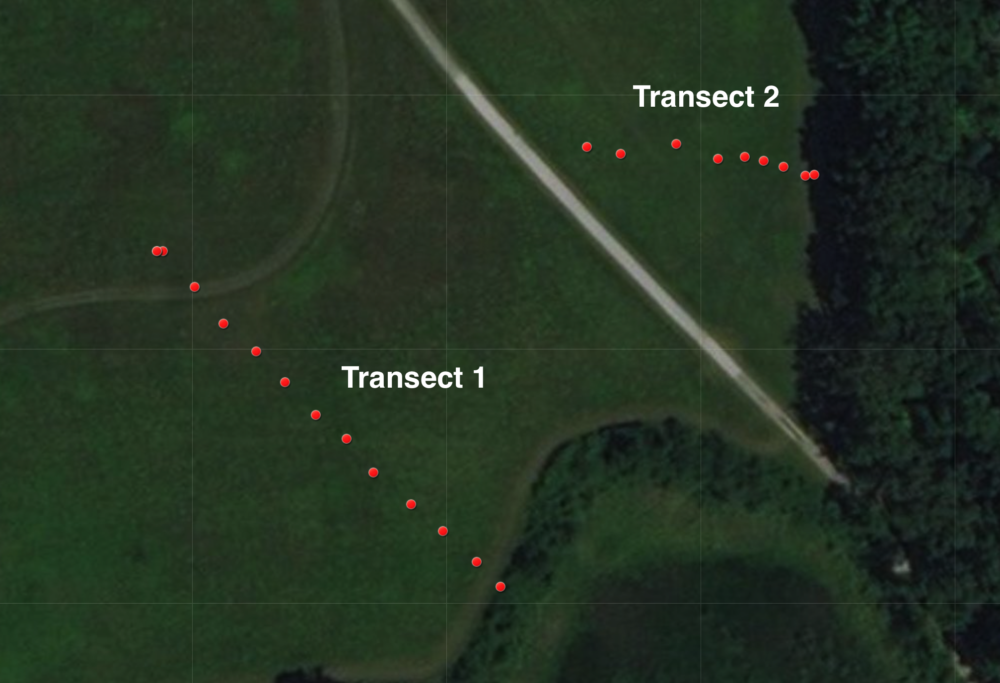

In [4]:
display.Image("data/Screen Shot 2021-04-16 at 1.16.29 PM.png")

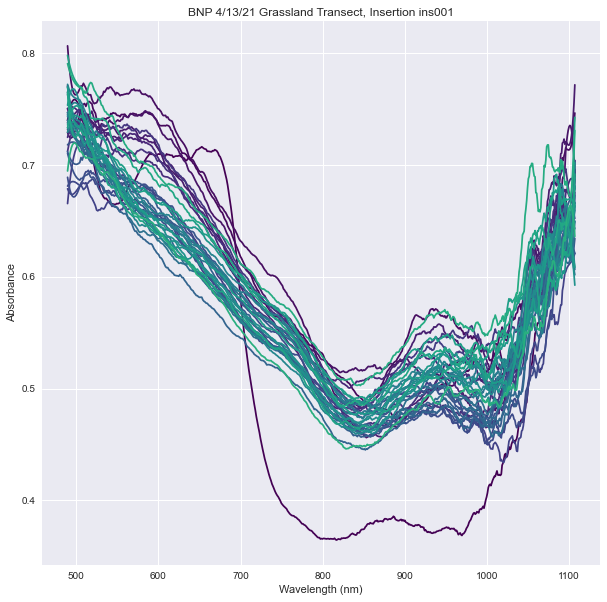

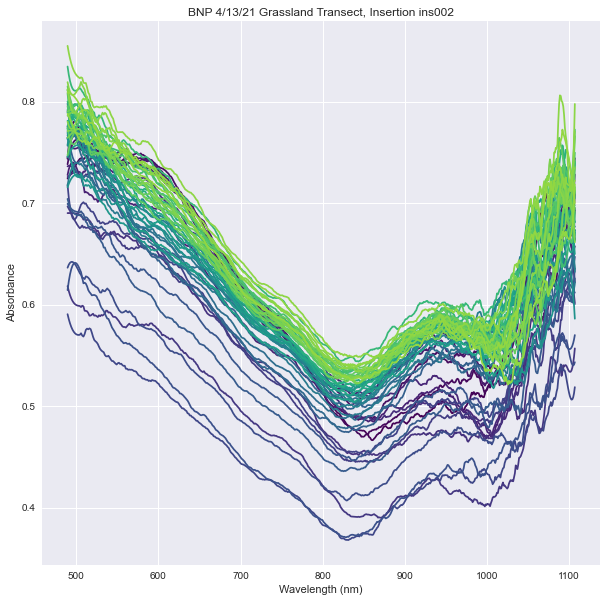

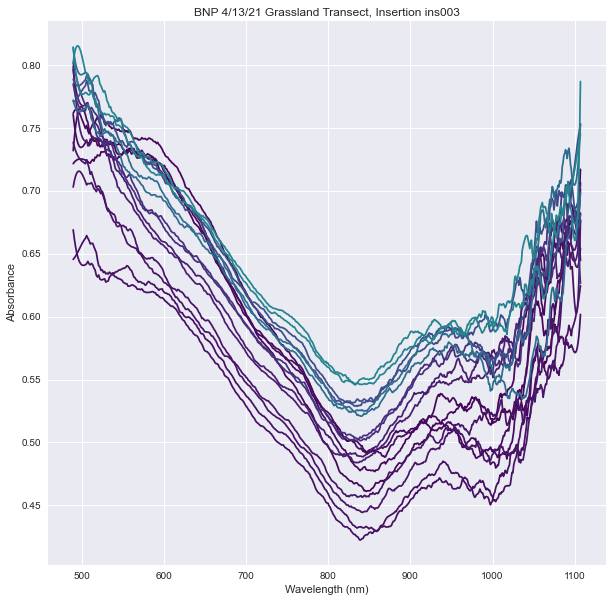

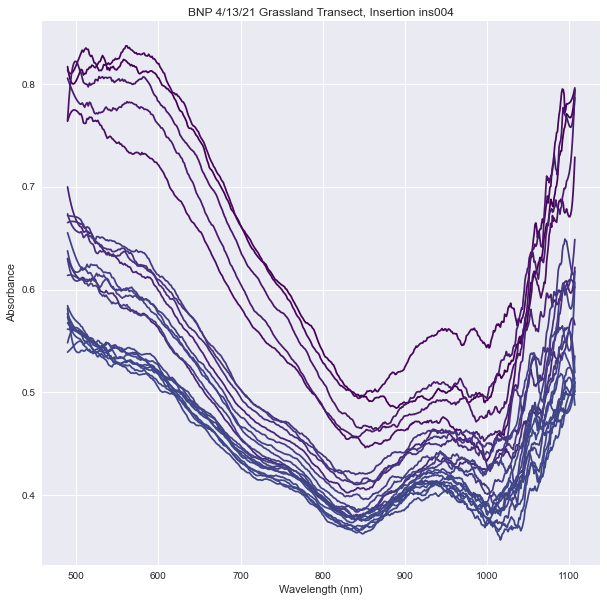

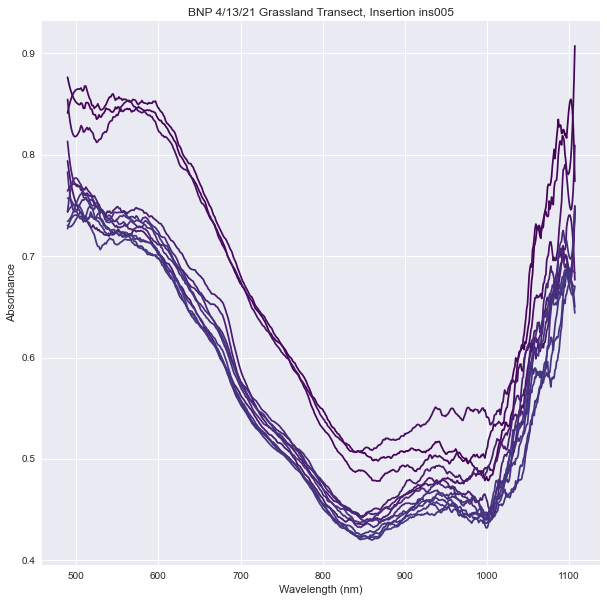

...

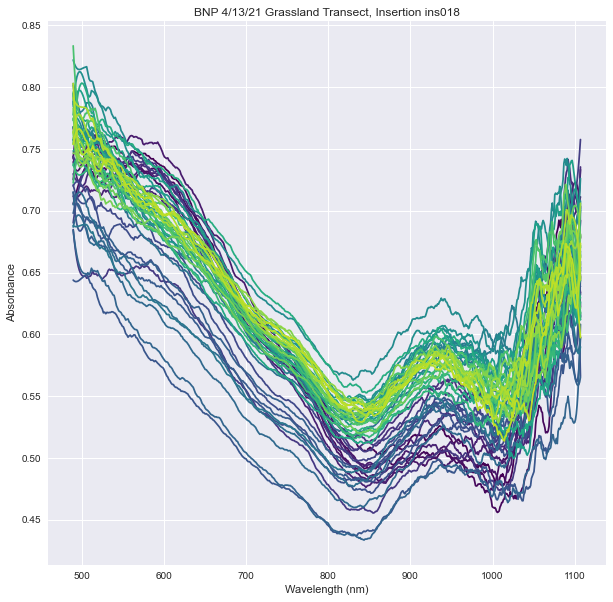

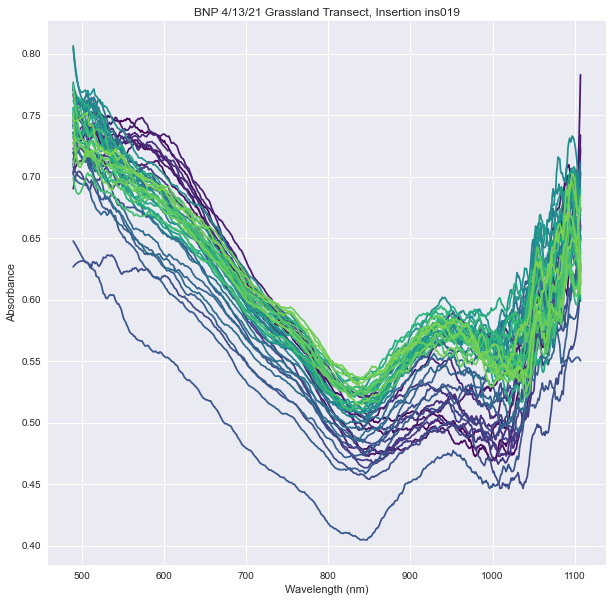

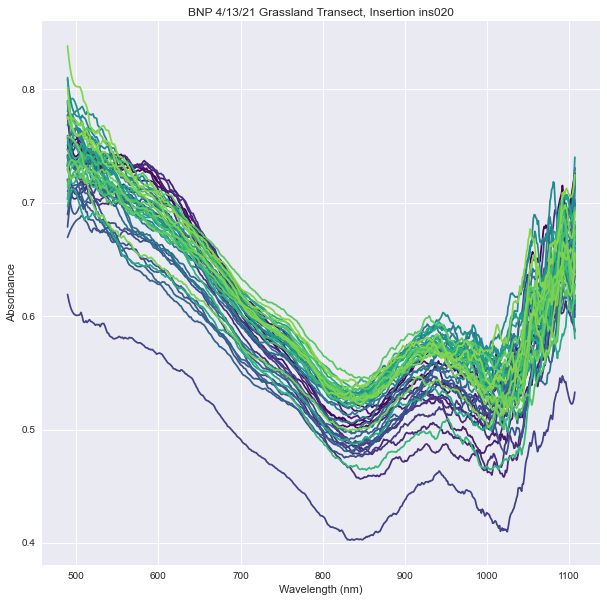

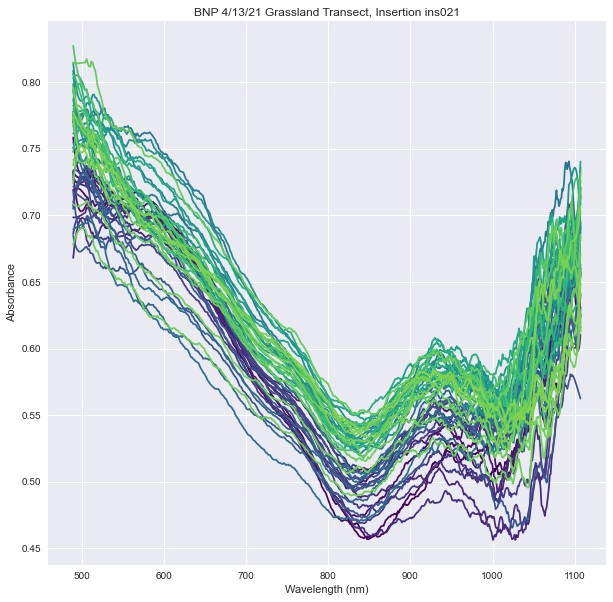

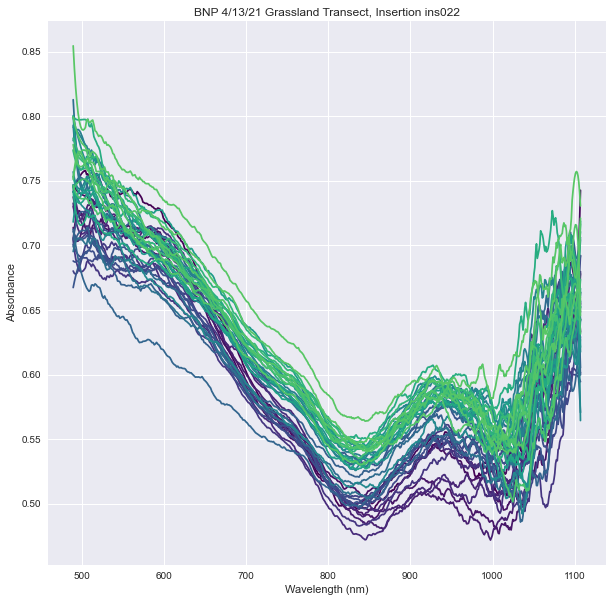

In [5]:
for insert in inserts:
    ins_abs_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()

### More of first transect

The first two of these insertions are the last two of Transect 1, at the bottom of the hill.  We recalibrated before these insertions.

We then re-did two of the insertions that had been done previously.

In [6]:
ses2 = 'session002/cal001'
inserts = list(h5_file['session002/cal001'].keys())

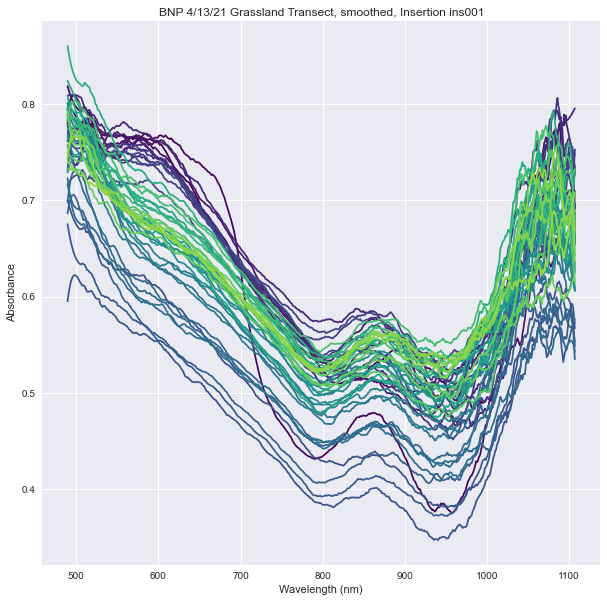

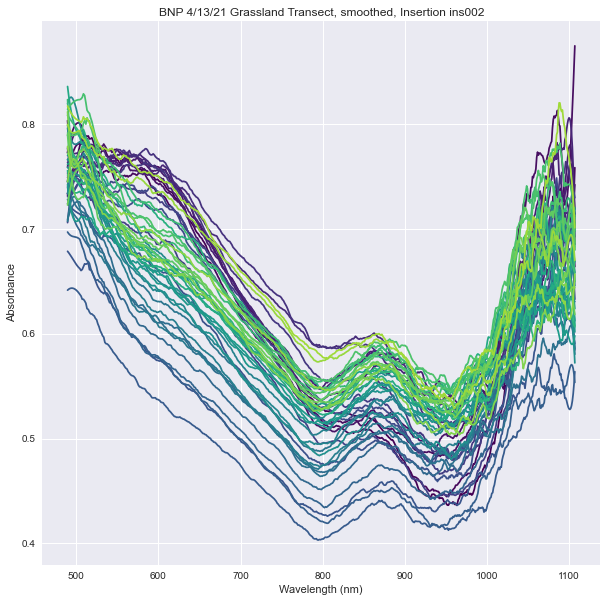

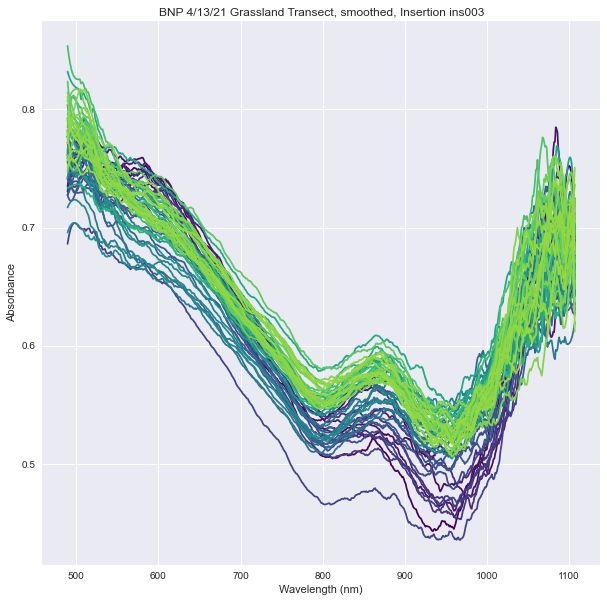

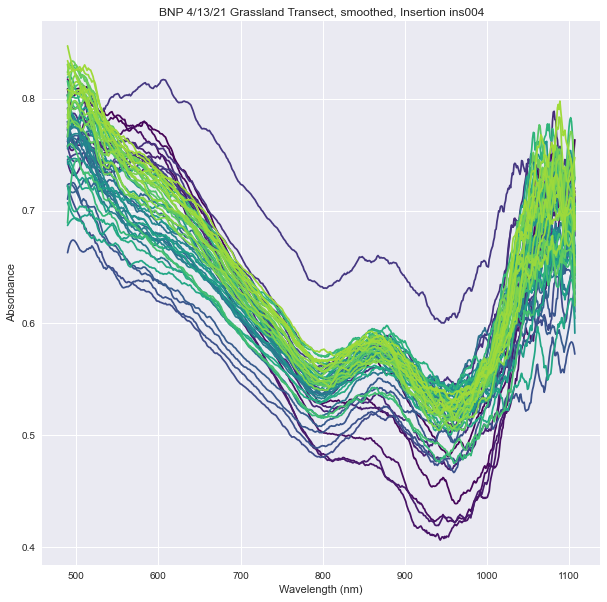

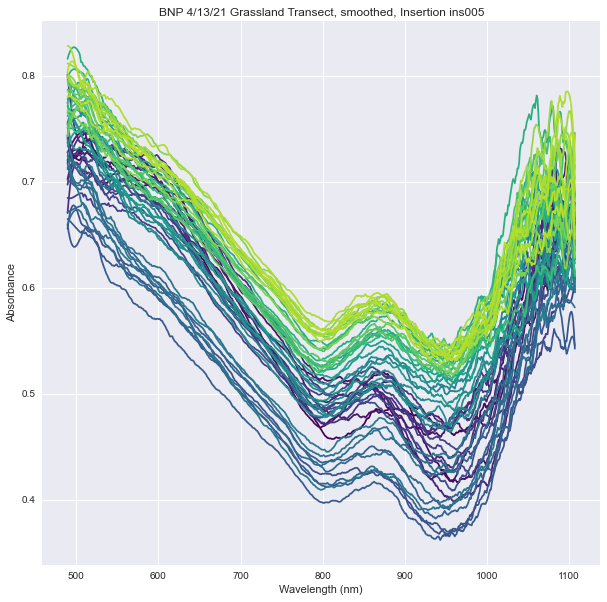

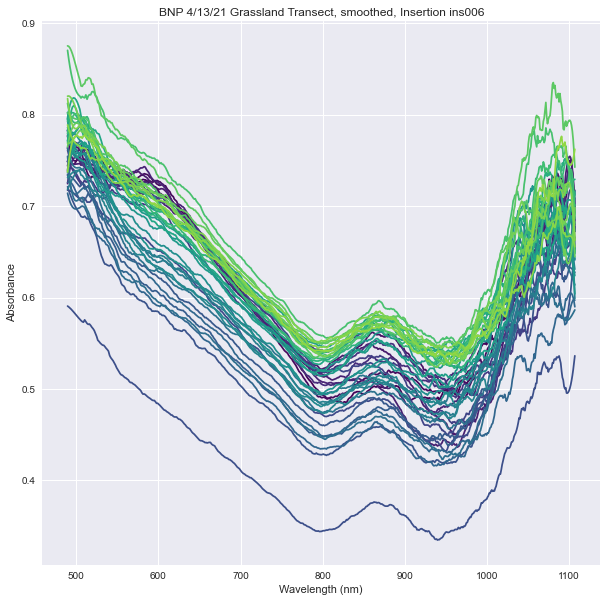

In [7]:
for insert in inserts:
    ins_abs_all = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()
    plt.close()

# Transect number 1, FTIR engine

Same insertions as previously.

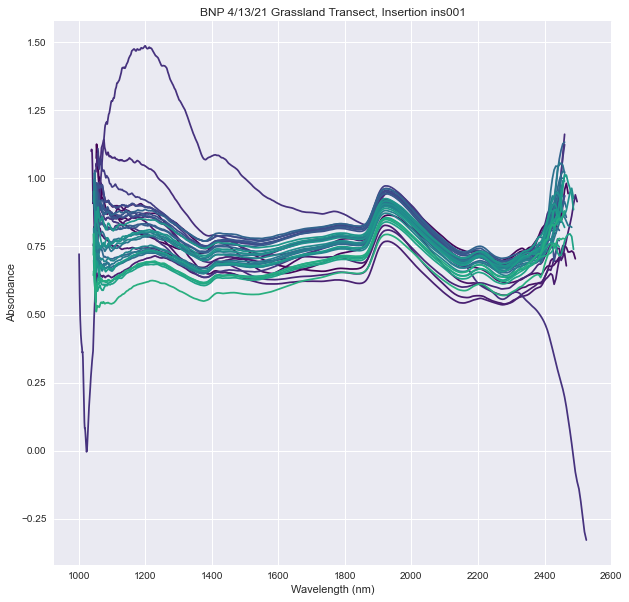

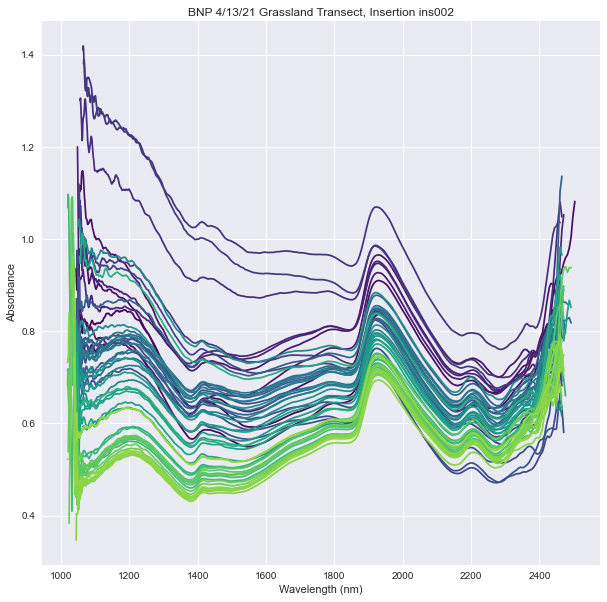

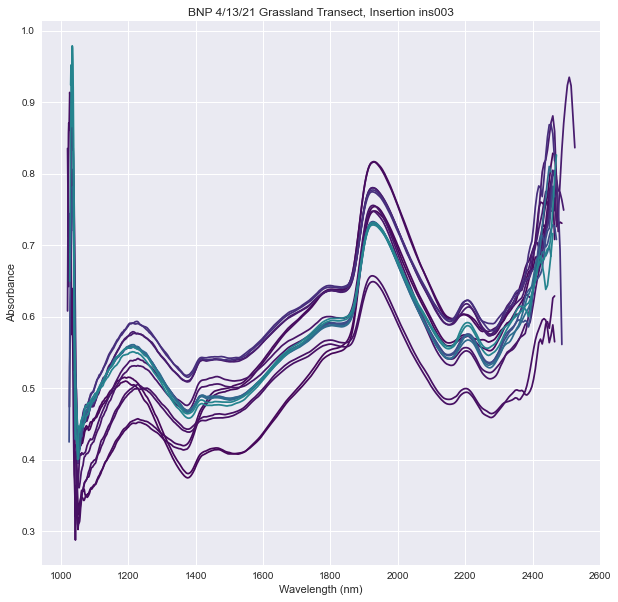

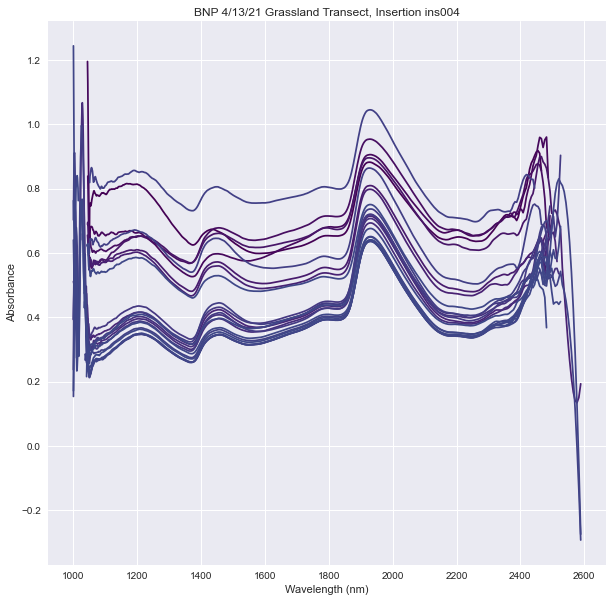

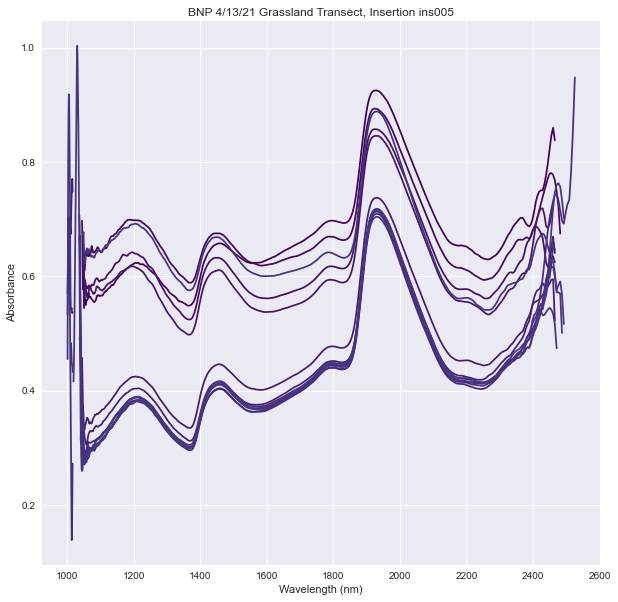

...

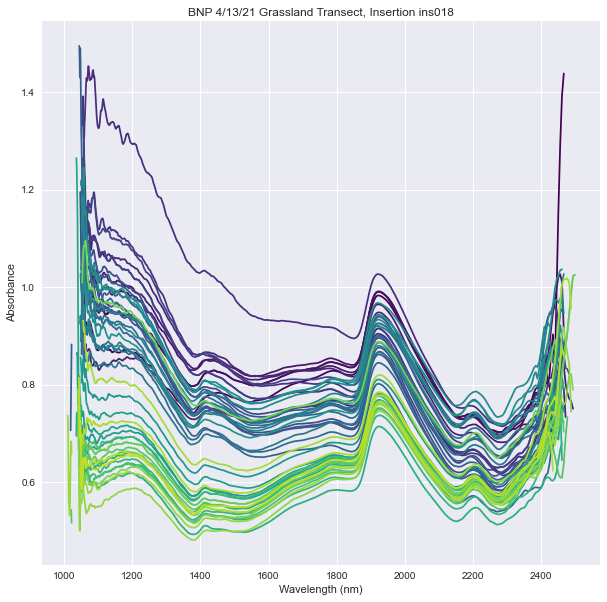

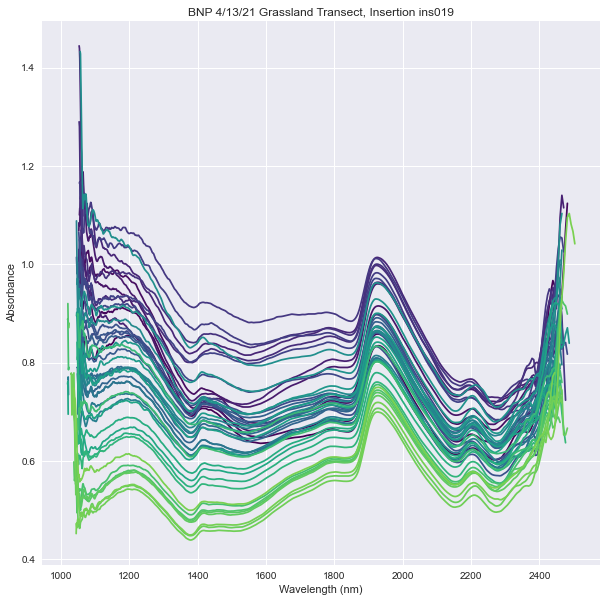

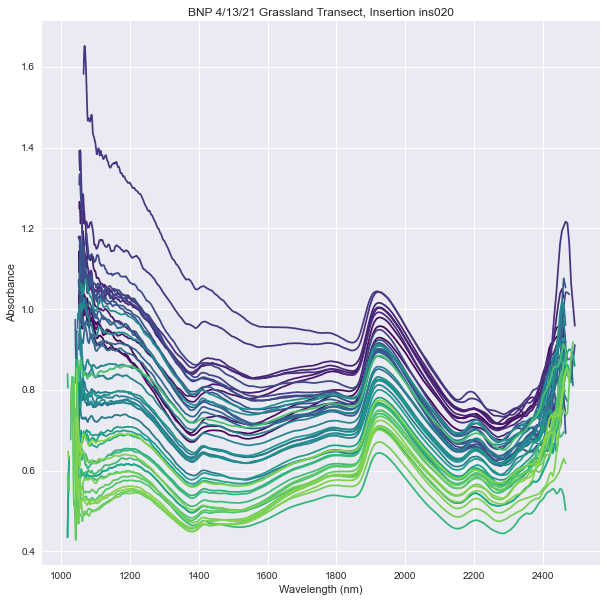

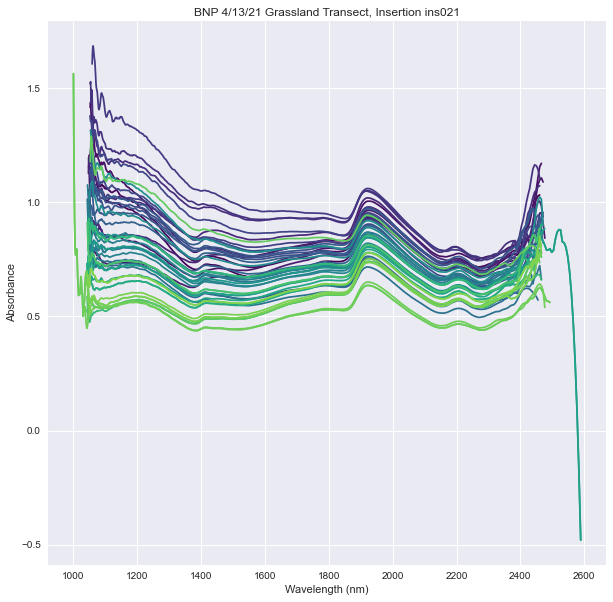

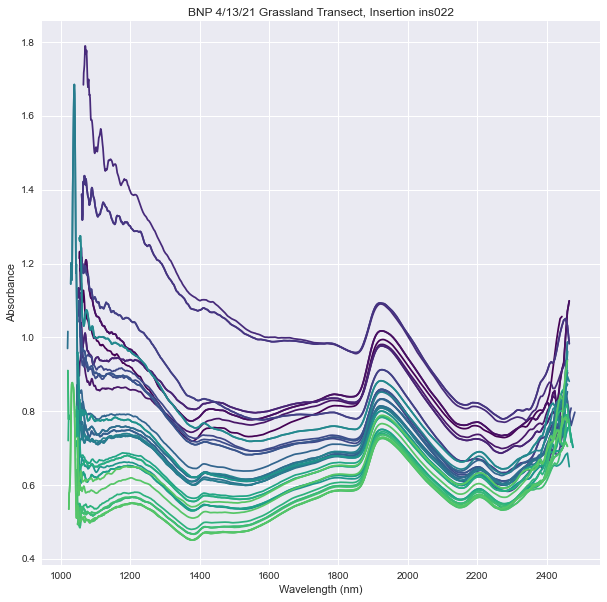

In [8]:
ses1 = 'session001/cal001'
inserts = list(h5_file[f'{ses1}'].keys())
for insert in inserts:
    ins_abs_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, 512:-2]
    ins_depths = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(ftir_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()

### Second part of FTIR engine transect.

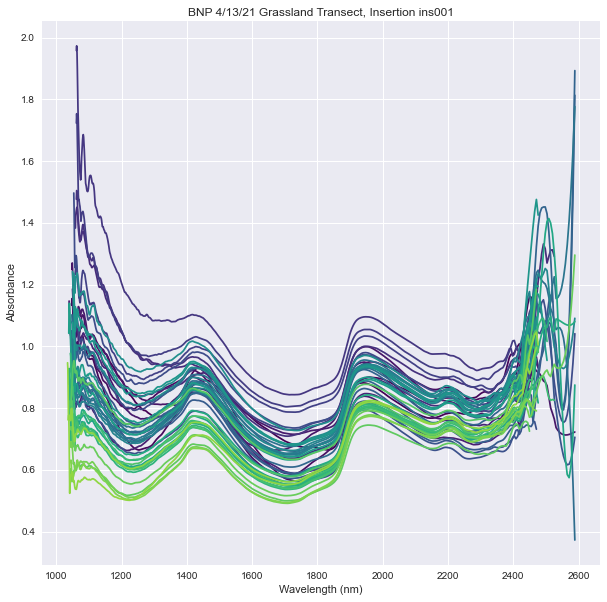

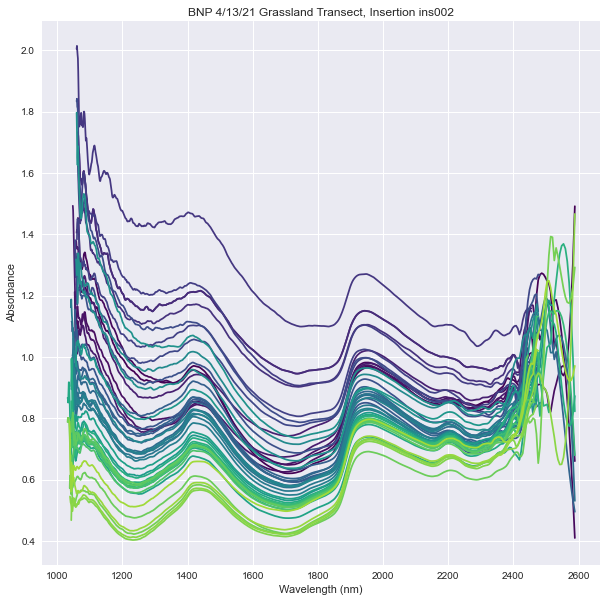

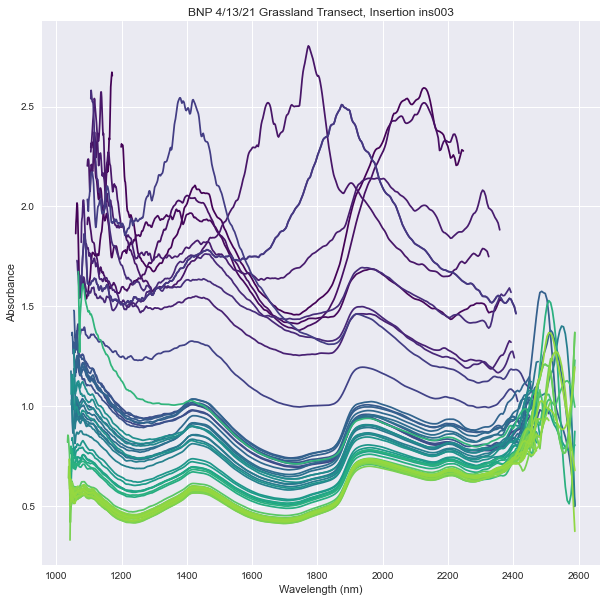

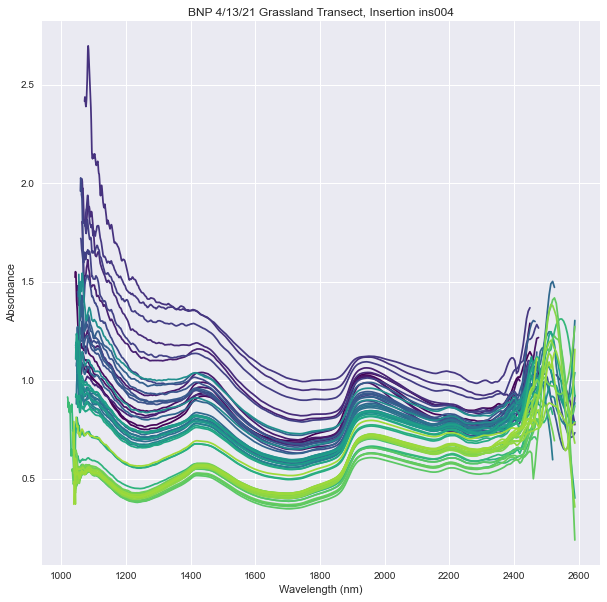

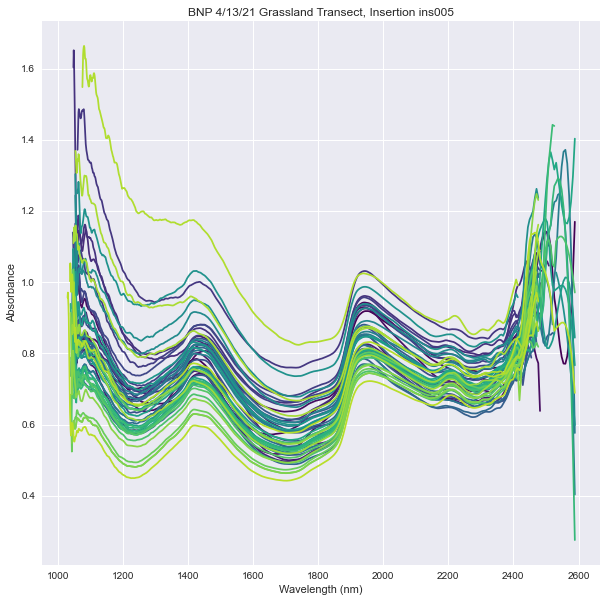

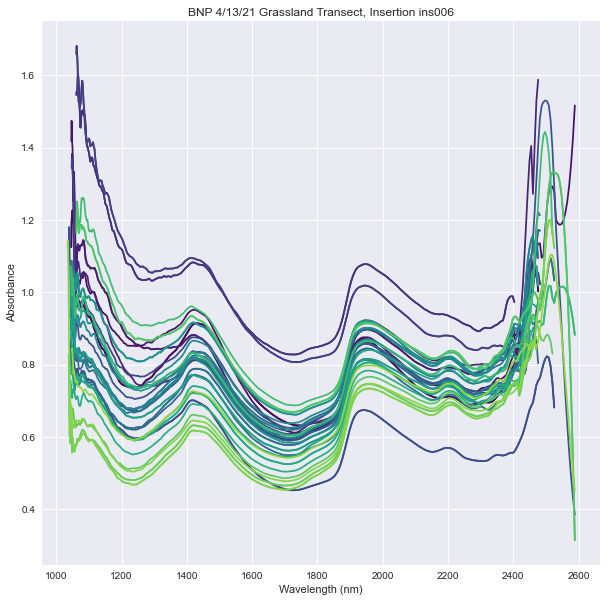

In [9]:
inserts = list(h5_file['session002/cal001'].keys())
ses2 = 'session002/cal001'


for insert in inserts:
    ins_abs_all = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, 512:-2]
    ins_depths = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        color = plt.cm.viridis(normalize_depth(ins_depths[i]))
        ax.plot(ftir_waves, savgol_filter(ins_abs[i, :], 21, 3), color=color)
    plt.show()

# Calibration curves

In [10]:
def create_list_of_items_in_node(item_type, h5_file, node):
    keys = []
    if item_type == "group":
        my_type = h5py._hl.group.Group
    if item_type == "dataset":
        my_type = h5py._hl.dataset.Dataset
    h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
    return keys

def create_list_of_calibrations_in_node(h5_file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(group)
    return calibrations

In [11]:
calibrations = create_list_of_calibrations_in_node(h5_file, '/')

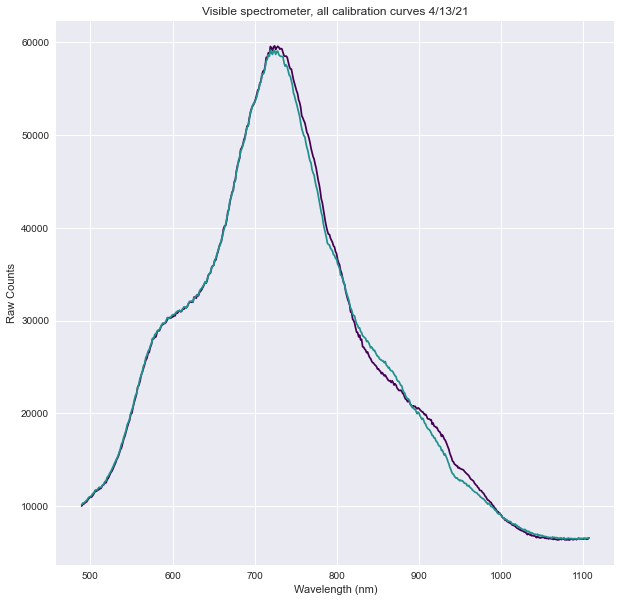

In [12]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title("Visible spectrometer, all calibration curves 4/13/21")
ax.set_ylabel("Raw Counts")
ax.set_xlabel("Wavelength (nm)")
#ax.set_ylim(10000, 30000)
for calibration in calibrations:
    index_value = calibrations.index(calibration)
    color = plt.cm.viridis(index_value/len(calibrations))
    spectrum = h5_file[calibration].attrs['white_spectrum'][:]
    ax.plot(vis_waves, spectrum, color=color)

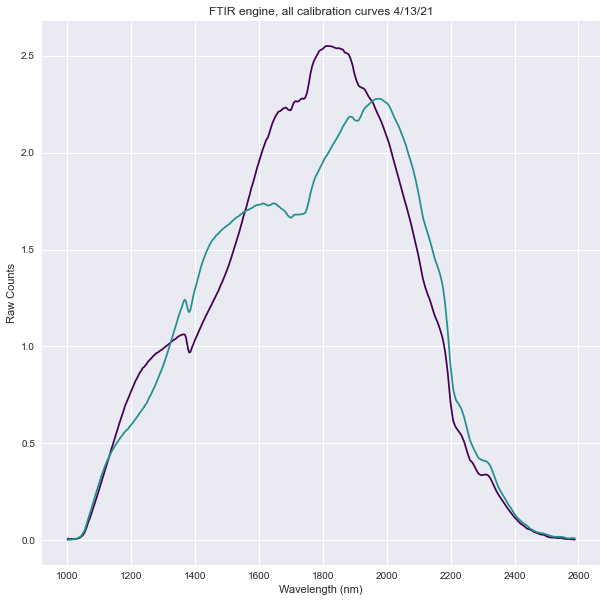

In [13]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title("FTIR engine, all calibration curves 4/13/21")
ax.set_ylabel("Raw Counts")
ax.set_xlabel("Wavelength (nm)")
#ax.set_ylim(10000, 30000)
for calibration in calibrations:
    index_value = calibrations.index(calibration)
    color = plt.cm.viridis(index_value/len(calibrations))
    spectrum = h5_file[calibration].attrs['white_spectrum2'][:]
    ax.plot(ftir_waves, spectrum, color=color)

In [14]:
h5_file.close()